# Report

## Loading trained model

In [23]:
import io
import base64
import torch
import torchaudio
import matplotlib.pyplot as plt
import numpy as np
from hydra import compose, initialize
from hydra.utils import instantiate
from huggingface_hub import hf_hub_download
from IPython.display import Audio, HTML, display
import json
from tqdm.notebook import tqdm
import librosa.display

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
with initialize(version_base=None, config_path="src/configs"):
    config = compose(config_name="inference")

model = instantiate(config.model).to(device)

pretrained_path = hf_hub_download(
    repo_id=config.inferencer.get("from_pretrained"), filename="model.pth"
)

checkpoint = torch.load(pretrained_path, device, weights_only=False)

state_dict = checkpoint.get("state_dict") if checkpoint.get("state_dict") else checkpoint
state_dict = {k.replace('_orig_mod.', ''): v for k, v in state_dict.items()}
model.load_state_dict(state_dict)
model.eval()

audio_to_mel = instantiate(config.transforms.instance_transforms.train.audio_to_mel)

/home/jovyan/.mlspace/envs/zenman67/lib/python3.11/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)
OneLogger: Setting error_handling_strategy to DISABLE_QUIETLY_AND_REPORT_METRIC_ERROR for rank (rank=0) with OneLogger disabled. To override: explicitly set error_handling_strategy parameter.
No exporters were provided. This means that no telemetry data will be collected.


## Inner analysis

In [49]:
dataset_path = "data/LJSpeech-1.1/index.json"
audio_path = "data/LJSpeech-1.1/wavs"
samples = json.load(open(dataset_path))[:5]

with torch.no_grad():
    for sample in tqdm(samples):
        audio, sr = torchaudio.load(sample["path"])
        sample["audio"] = audio

        mel = audio_to_mel(audio).to(device)
        sample["mel"] = mel

        output = model(mel=mel)
        audio_pred = output["audio_pred"][0].cpu()
        sample["audio_pred"] = audio_pred

        mel_pred = audio_to_mel(audio_pred)
        sample["mel_pred"] = mel_pred

  0%|          | 0/5 [00:00<?, ?it/s]

### Audio

In [50]:
def audio_grid(samples, sr=22050):
    html = """
    <table style="width:100%; border-collapse: collapse;">
      <tr>
        <th style="text-align:center; padding:8px;">audio_pred</th>
        <th style="text-align:center; padding:8px;">audio</th>
      </tr>
    """

    for i, s in enumerate(samples):
        html += f"""
        <tr>
          <td style="vertical-align: top; padding: 10px; text-align:center;">
            <div>Sample {i} — Predicted</div>
            {Audio(s["audio_pred"], rate=sr)._repr_html_()}
          </td>

          <td style="vertical-align: top; padding: 10px; text-align:center;">
            <div>Sample {i} — Ground Truth</div>
            {Audio(s["audio"], rate=sr)._repr_html_()}
          </td>
        </tr>
        """

    html += "</table>"
    display(HTML(html))


audio_grid(samples[:3], sr=22050)

audio_pred,audio


### Mel

mel_pred,mel (target)
,
,
,
,
,

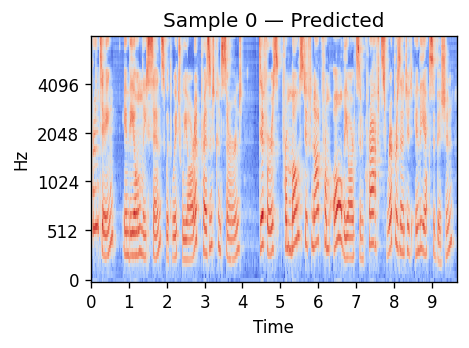
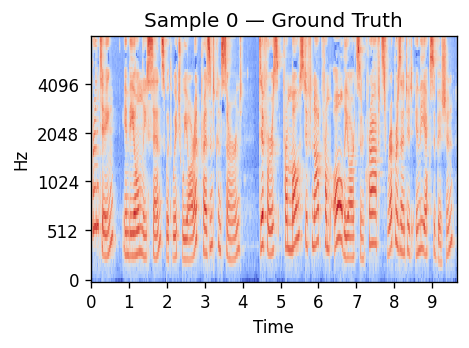
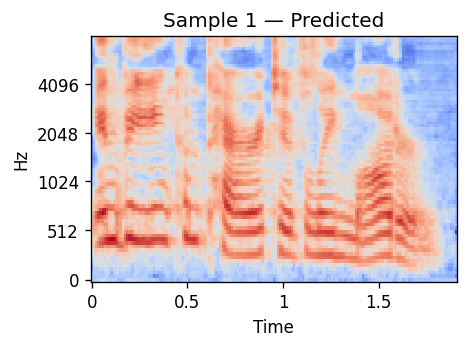
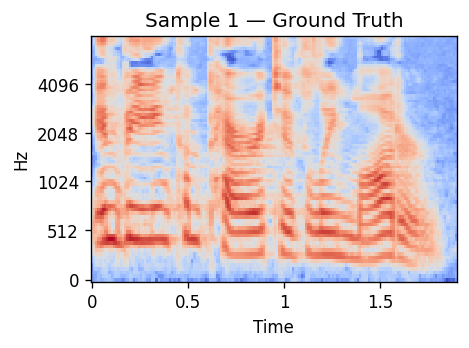
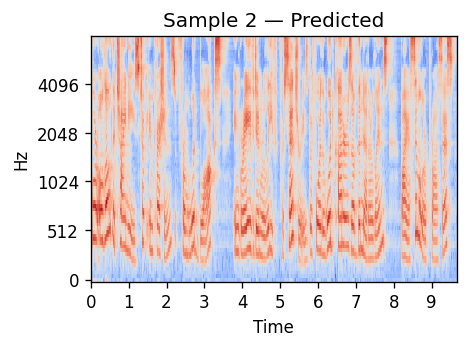
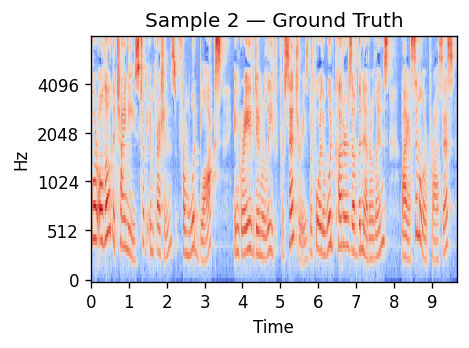
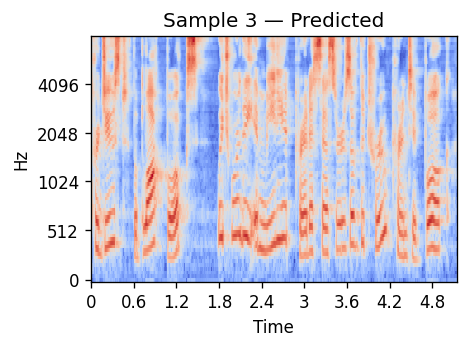
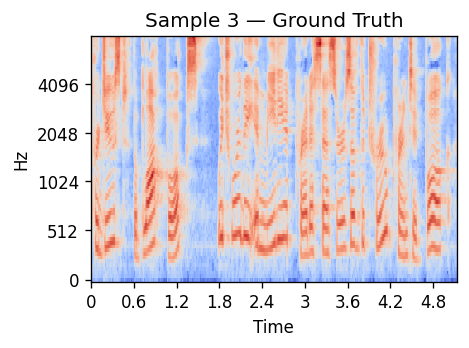
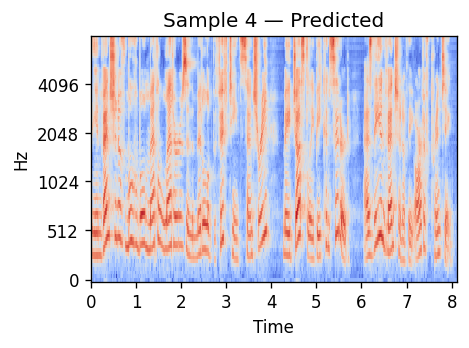
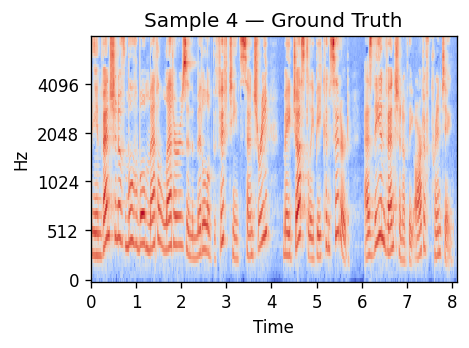

In [51]:
def mel_to_base64(mel,
                  sr: int = 22050,
                  hop_length: int = 256,
                  fmin: int = 0,
                  fmax: int = 8000,
                  title: str = "") -> str:
    mel = mel.detach().cpu().squeeze(0).numpy()

    fig, ax = plt.subplots(figsize=(4, 3))
    librosa.display.specshow(
        mel,
        x_axis="time",
        y_axis="mel",
        sr=sr,
        hop_length=hop_length,
        fmin=fmin,
        fmax=fmax,
        ax=ax,
    )
    ax.set_title(title)
    fig.tight_layout()

    buf = io.BytesIO()
    fig.savefig(buf, format="png", bbox_inches="tight", dpi=120)
    plt.close(fig)
    buf.seek(0)
    img_b64 = base64.b64encode(buf.read()).decode("ascii")

    return f'<img src="data:image/png;base64,{img_b64}" />'


def mel_grid(samples, sr=22050, hop_length=256, fmin=0, fmax=8000):
    html = """
    <table style="width:100%; border-collapse: collapse;">
      <tr>
        <th style="text-align:center; padding:8px;">mel_pred</th>
        <th style="text-align:center; padding:8px;">mel (target)</th>
      </tr>
    """

    for i, s in enumerate(samples):
        mel_pred_img = mel_to_base64(
            s["mel_pred"],
            sr=sr,
            hop_length=hop_length,
            fmin=fmin,
            fmax=fmax,
            title=f"Sample {i} — Predicted",
        )
        mel_gt_img = mel_to_base64(
            s["mel"],
            sr=sr,
            hop_length=hop_length,
            fmin=fmin,
            fmax=fmax,
            title=f"Sample {i} — Ground Truth",
        )

        html += f"""
        <tr>
          <td style="vertical-align: top; padding: 10px; text-align:center;">
            {mel_pred_img}
          </td>
          <td style="vertical-align: top; padding: 10px; text-align:center;">
            {mel_gt_img}
          </td>
        </tr>
        """

    html += "</table>"
    display(HTML(html))


mel_grid(samples[:5], sr=22050, hop_length=256, fmin=0, fmax=8000)

### Waveform

audio_pred,audio
,
,
,

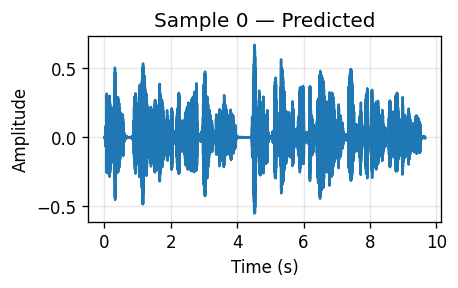
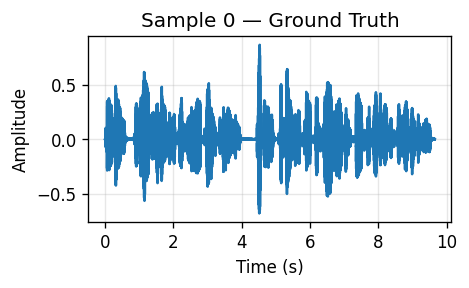
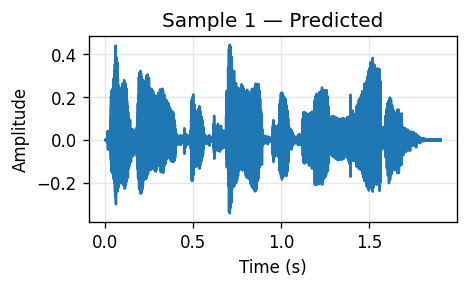
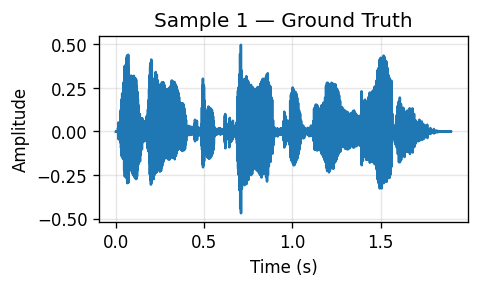
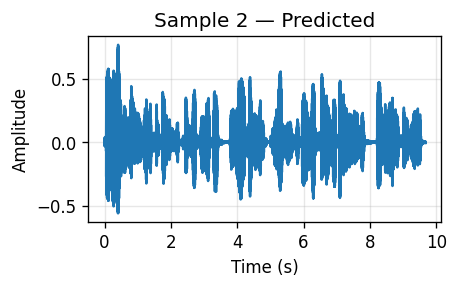
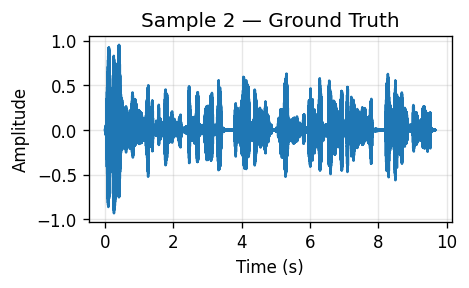

In [52]:
def waveform_to_base64(wave,
                       sr: int = 22050,
                       title: str = "") -> str:
    wave = wave.detach().cpu().squeeze(0).numpy()

    fig, ax = plt.subplots(figsize=(4, 2.5))
    t = np.arange(len(wave)) / sr
    ax.plot(t, wave)
    ax.set_title(title)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Amplitude")
    ax.grid(True, alpha=0.3)
    fig.tight_layout()

    buf = io.BytesIO()
    fig.savefig(buf, format="png", bbox_inches="tight", dpi=120)
    plt.close(fig)
    buf.seek(0)
    img_b64 = base64.b64encode(buf.read()).decode("ascii")

    return f'<img src="data:image/png;base64,{img_b64}" />'


def waveform_grid(samples, sr=22050):
    html = """
    <table style="width:100%; border-collapse: collapse;">
      <tr>
        <th style="text-align:center; padding:8px;">audio_pred</th>
        <th style="text-align:center; padding:8px;">audio</th>
      </tr>
    """

    for i, s in enumerate(samples):
        wav_pred_img = waveform_to_base64(
            s["audio_pred"],
            sr=sr,
            title=f"Sample {i} — Predicted",
        )
        wav_gt_img = waveform_to_base64(
            s["audio"],
            sr=sr,
            title=f"Sample {i} — Ground Truth",
        )

        html += f"""
        <tr>
          <td style="vertical-align: top; padding: 10px; text-align:center;">
            {wav_pred_img}
          </td>
          <td style="vertical-align: top; padding: 10px; text-align:center;">
            {wav_gt_img}
          </td>
        </tr>
        """

    html += "</table>"
    display(HTML(html))


waveform_grid(samples[:3], sr=22050)


### Conclusion

Предсказанные аудио почти что идеально повторяют GT. Однако в некоторых местах слышно, что голос немного синтетический. Но если внимательно не прислушиваться, то сгенерированные аудио вполне похожи на настоящие. 

В то же время мел-спектрограммы и вэйвформы тоже почти идентичны, на взгляд не видно между ними разницы

## External analysis

### Download dataset

In [37]:
import requests


def get_direct_download_link(public_link: str) -> str:
    api_url = "https://cloud-api.yandex.net/v1/disk/public/resources/download"
    params = {"public_key": public_link}
    response = requests.get(api_url, params=params)
    response.raise_for_status()
    href = response.json().get("href")
    return href


def download_file(url: str, dest_path: str):
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        total = int(r.headers.get("content-length", 0))
        with open(dest_path, "wb") as f, tqdm(total=total, unit="B", unit_scale=True, desc=dest_path) as bar:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
                bar.update(len(chunk))


public_link = "https://disk.360.yandex.ru/d/Mzh9T9OEZKSsww"
direct_link = get_direct_download_link(public_link)
download_file(direct_link, "custom_dataset.zip")
!unzip custom_dataset.zip

custom_dataset.zip:   0%|          | 0.00/6.21M [00:00<?, ?B/s]

Archive:  custom_dataset.zip
   creating: test_data/
   creating: test_data/transcriptions/
  inflating: test_data/transcriptions/shostakovich.txt  
  inflating: test_data/transcriptions/pupin.txt  
  inflating: test_data/transcriptions/dla.txt  
  inflating: test_data/transcriptions/bernstein.txt  
  inflating: test_data/transcriptions/termen.txt  
   creating: test_data/gt_audio/
  inflating: test_data/gt_audio/bernstein.wav  
  inflating: test_data/gt_audio/dla.wav  
  inflating: test_data/gt_audio/pupin.wav  
  inflating: test_data/gt_audio/shostakovich.wav  
  inflating: test_data/gt_audio/termen.wav  


In [61]:
import os

dataset_path = "test_data"
audio_path = "test_data/gt_audio"
text_path = "test_data/transcriptions"

samples_external = []

with torch.no_grad():

    for file in tqdm(os.listdir(audio_path)):
        sample = {}

        audio, sr = torchaudio.load(os.path.join(audio_path, file))
        audio = audio[0:1, :]
        sample["audio"] = audio

        mel = audio_to_mel(audio).to(device)
        sample["mel"] = mel

        output = model(mel=mel)
        audio_pred = output["audio_pred"][0].cpu()
        sample["audio_pred"] = audio_pred

        mel_pred = audio_to_mel(audio_pred)
        sample["mel_pred"] = mel_pred

        sample["text"] = open(os.path.join(text_path, file).replace(".wav", ".txt")).read().strip()

        samples_external.append(sample)

  0%|          | 0/5 [00:00<?, ?it/s]

### Audio

In [62]:
audio_grid(samples_external[:3], sr=22050)

audio_pred,audio


### Mel

mel_pred,mel (target)
,
,
,

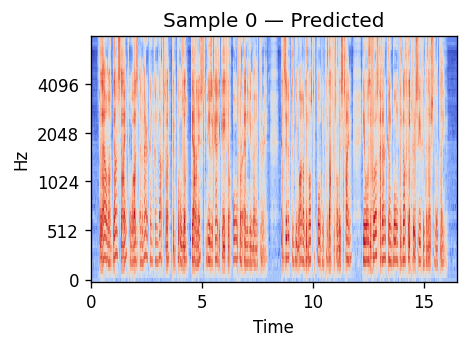
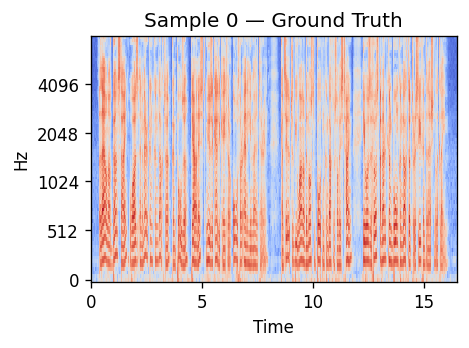
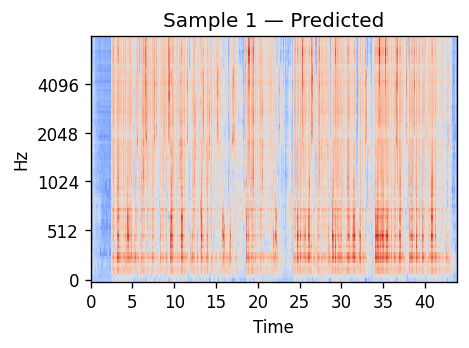
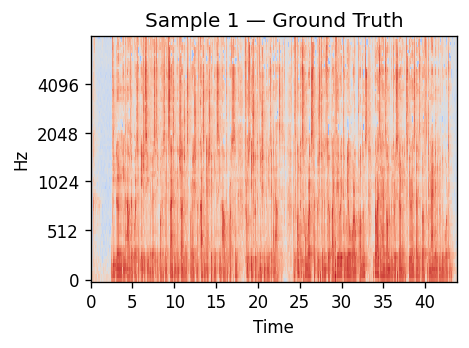
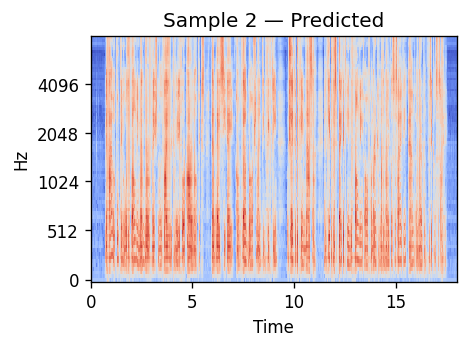
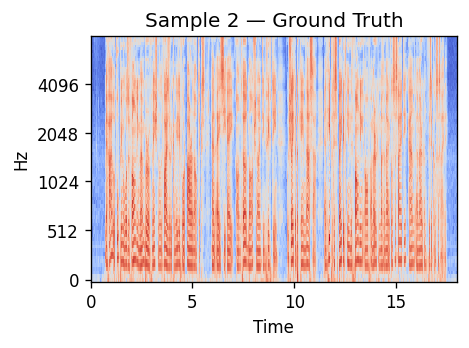

In [65]:
mel_grid(samples_external[:3], sr=22050, hop_length=256, fmin=0, fmax=8000)

### Waveform

audio_pred,audio
,
,
,

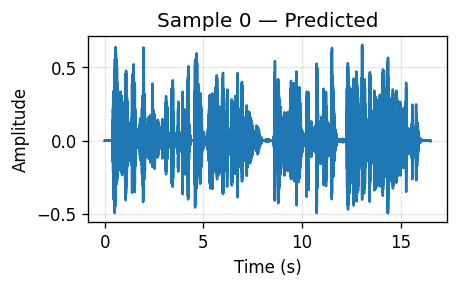
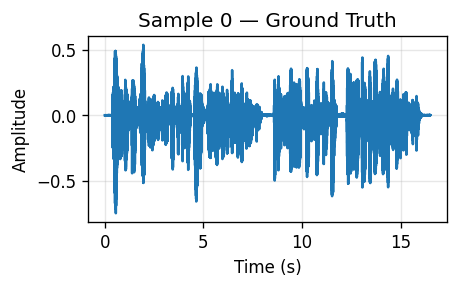
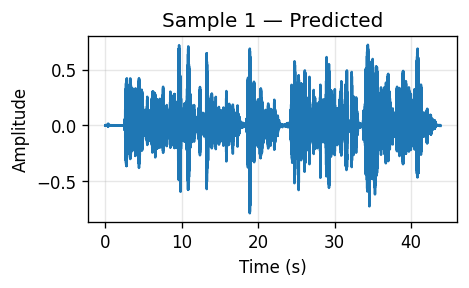
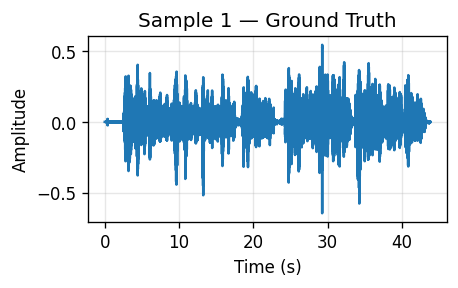
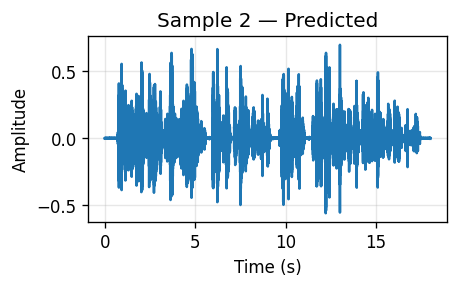
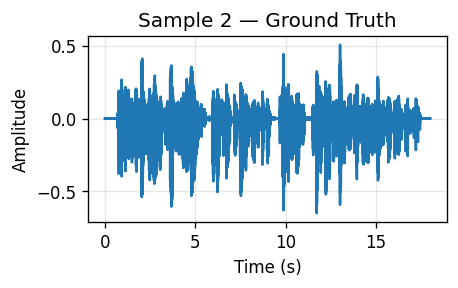

In [66]:
waveform_grid(samples_external[:3], sr=22050)

### Conclusion

На этих аудио ситуация стала сильно плачевнее. Вероятно, это связано с тем, что на записи совсем другой голос. Тем не менее, несмотря на большое количество шума, слова все еще различимы.

По мел-спектрограмме и вэйвформе все еще нельзя сказать, что аудио сгенерировано (на мой взгляд). Однако на этот раз для сгенерированного аудио эти характеристики заметно отличаются от GT.